# ***Company Bankrupcy Prediction (Using Decision Tree)***

## **Problem Statement :**
The goal of this project is to **predict whether a company is likely to go bankrupt, using a Decision Tree** classification model

Bankruptcy prediction is crucial for:

1.   Investors and creditors assessing financial risk
2.   Early warning systems for companies
3. Supporting data-driven financial decisions

## **Dataset Information**

**Source:** UCI Machine Learning Repository – Taiwanese Bankruptcy Prediction Dataset

**Years Covered:** 1999–2009

**Instances:** 6,819 companies

**Features:** 95 financial ratios (X1–X95)

**Target:** Y = 1 → bankrupt, Y = 0 → not bankrupt

The dataset includes key financial ratios such as ROA, operating profit, debt ratios, cash flow, equity ratios, current ratio, and more.

## **Objective**

Develop a Decision Tree model using scikit-learn to classify companies as bankrupt or not, including:

1. Data preprocessing
2. Feature Reduction using PCA

2. Decision Tree training

3. Evaluation with 5 - cross-validation

4. Comparision Before Tuning and After Tuning

## **Importing Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings as wr
wr.filterwarnings('ignore')

## **Loading Data**

In [2]:
from google.colab import files
files.upload()

Saving data.csv to data.csv


{'data.csv': b"Bankrupt?, ROA(C) before interest and depreciation before interest, ROA(A) before interest and % after tax, ROA(B) before interest and depreciation after tax, Operating Gross Margin, Realized Sales Gross Margin, Operating Profit Rate, Pre-tax net Interest Rate, After-tax net Interest Rate, Non-industry income and expenditure/revenue, Continuous interest rate (after tax), Operating Expense Rate, Research and development expense rate, Cash flow rate, Interest-bearing debt interest rate, Tax rate (A), Net Value Per Share (B), Net Value Per Share (A), Net Value Per Share (C), Persistent EPS in the Last Four Seasons, Cash Flow Per Share, Revenue Per Share (Yuan \xc2\xa5), Operating Profit Per Share (Yuan \xc2\xa5), Per Share Net profit before tax (Yuan \xc2\xa5), Realized Sales Gross Profit Growth Rate, Operating Profit Growth Rate, After-tax Net Profit Growth Rate, Regular Net Profit Growth Rate, Continuous Net Profit Growth Rate, Total Asset Growth Rate, Net Value Growth Ra

## **I. EDA**

### **1. Reading the data**

In [3]:
df = pd.read_csv('data.csv')
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


## **2. Analyzing Data**

### **2.a. Checking the Shape**

In [4]:
df.shape #(no of rows, no of coloumns)

(6819, 96)

### **2.b. Checking information about the dataset**

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

### **2.c. Statistical Summary of the Dataset**

In [6]:
'''
This method gives a statistical summary of the DataFrame (Transpose) showing values like
count, mean, standard deviation, minimum and quartiles for each numerical column.
'''
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.0,0.032263,0.176710,0.0,0.000000,0.000000,0.000000,1.0
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Net Income Flag,6819.0,1.000000,0.000000,1.0,1.000000,1.000000,1.000000,1.0


### **2.d. Convert the column names of the DataFrame into a Python list**

In [7]:
df.columns.tolist()

['Bankrupt?',
 ' ROA(C) before interest and depreciation before interest',
 ' ROA(A) before interest and % after tax',
 ' ROA(B) before interest and depreciation after tax',
 ' Operating Gross Margin',
 ' Realized Sales Gross Margin',
 ' Operating Profit Rate',
 ' Pre-tax net Interest Rate',
 ' After-tax net Interest Rate',
 ' Non-industry income and expenditure/revenue',
 ' Continuous interest rate (after tax)',
 ' Operating Expense Rate',
 ' Research and development expense rate',
 ' Cash flow rate',
 ' Interest-bearing debt interest rate',
 ' Tax rate (A)',
 ' Net Value Per Share (B)',
 ' Net Value Per Share (A)',
 ' Net Value Per Share (C)',
 ' Persistent EPS in the Last Four Seasons',
 ' Cash Flow Per Share',
 ' Revenue Per Share (Yuan ¥)',
 ' Operating Profit Per Share (Yuan ¥)',
 ' Per Share Net profit before tax (Yuan ¥)',
 ' Realized Sales Gross Profit Growth Rate',
 ' Operating Profit Growth Rate',
 ' After-tax Net Profit Growth Rate',
 ' Regular Net Profit Growth Rate',
 ' C

### **2.e. Checking Null or Missing Values**


> **df.isnull().sum()** - sums along coloumns by default (i.e, counts the number of missing values per coloumn)

> **df.isnull().sum().sum()** - sums all counts (i.e., gives all missing values in the dataframe)



In [8]:
print(df.isnull().sum().sum()) #check for missing values in a pandas DataFrame

0


### **2.f. Checking for Duplicate Values**

In [9]:
print(df.duplicated().sum())

0


In [10]:
df.nunique() #how many unique values exist in each column which provides insight into the variety of data in each feature.

,0
Bankrupt?,2
ROA(C) before interest and depreciation before interest,3333
ROA(A) before interest and % after tax,3151
ROA(B) before interest and depreciation after tax,3160
Operating Gross Margin,3781
...,...
Liability to Equity,6819
Degree of Financial Leverage (DFL),6240
Interest Coverage Ratio (Interest expense to EBIT),6240
Net Income Flag,1


### **3. Visulization**

#### **3.a. Bar Plot**

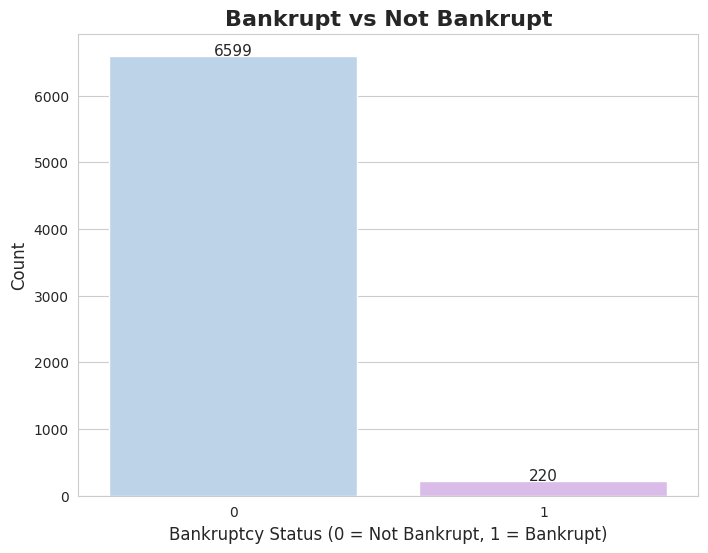

In [11]:
# Set a style for better aesthetics
sns.set_style("whitegrid")

# Create the figure with a larger size
plt.figure(figsize=(8, 6))

# Create the count plot with clear labels and palette
sns.countplot(
    x='Bankrupt?',
    data=df,
    palette=['#B4D3F0', '#DDB4F0']  # blue for 0, pink for 1
)

# Add title and labels with proper formatting
plt.title('Bankrupt vs Not Bankrupt', fontsize=16, fontweight='bold')
plt.xlabel('Bankruptcy Status (0 = Not Bankrupt, 1 = Bankrupt)', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Add the count values on top of bars
for p in plt.gca().patches:
    plt.text(
        p.get_x() + p.get_width() / 2,
        p.get_height() + 5,
        int(p.get_height()),
        ha='center',
        fontsize=11
    )

# Show the plot
plt.show()


#### **3.b. Kernel Density Plot**
> To check the ditribution of features and find of the imbalanced features before modelling

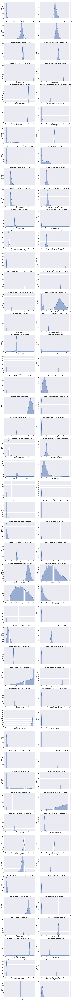

In [12]:
# Set a nicer style
sns.set_style("darkgrid")

# Select only numerical columns (int64 and float64)
numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns

# Determine grid layout: 2 columns
n_cols = 2
n_rows = (len(numerical_columns) + 1) // n_cols

plt.figure(figsize=(14, n_rows * 4))

# Loop through numerical columns and plot histograms
for idx, feature in enumerate(numerical_columns, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.histplot(df[feature], kde=True, color="#4C72B0", bins=30)

    # Add title with skewness
    plt.title(f"{feature} | Skewness: {df[feature].skew():.2f}", fontsize=12, fontweight='bold')

    # Optional: x-label and y-label
    plt.xlabel(feature)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

#### **Tablulating the above skewness data**

In [13]:
# Select numerical columns
numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns

# Create the skewness table
skew_table = pd.DataFrame({
    'Column': numerical_columns,
    'Skewness': [df[col].skew() for col in numerical_columns]
})

# Round skewness for readability
skew_table['Skewness'] = skew_table['Skewness'].round(2)

# Highlight highly skewed columns (|skew| > 1)
def highlight_skew(val):
    color = 'red' if abs(val) > 1 else 'lightgreen'
    return f'background-color: {color}'

# Display styled table
skew_table.style.applymap(highlight_skew, subset=['Skewness'])

,Column,Skewness
0,Bankrupt?,5.300000
1,ROA(C) before interest and depreciation before interest,-0.320000
2,ROA(A) before interest and % after tax,-1.030000
3,ROA(B) before interest and depreciation after tax,-0.760000
4,Operating Gross Margin,-8.040000
5,Realized Sales Gross Margin,-8.070000
6,Operating Profit Rate,-70.240000
7,Pre-tax net Interest Rate,-52.480000
8,After-tax net Interest Rate,-53.000000
9,Non-industry income and expenditure/revenue,39.640000


#### **3.c. Heat Map Correlations**
> Since the dataset is multivariate.

> We have used two targeted heatmaps as our dataset is extremely huge and would be too computationally intensive.

> 1.   Feature - Target Correlation
2.   Feature - Feature Correlation



> **Feature-Target Correlation**

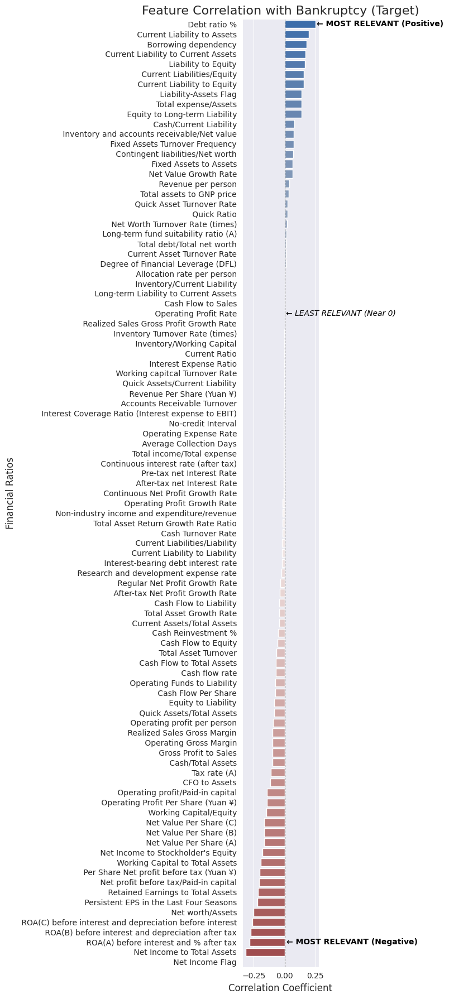

In [14]:
# --- 1. Calculate and Sort Correlations ---
# Calculate correlations with the target variable 'Bankrupt?'
target_correlation = df.corr()['Bankrupt?'].drop('Bankrupt?').sort_values(ascending=False)

# --- 2. Identify Most and Least Relevant Features ---
# The most relevant are those with the highest absolute correlation.
# We'll take the top 3 and bottom 3 (most negative) as they drive the splits.

# Get features with the highest POSITIVE correlation (Strongest predictors of Bankruptcy)
top_positive = target_correlation.head(3)

# Get features with the highest NEGATIVE correlation (Strongest predictors of NOT Bankruptcy)
top_negative = target_correlation.tail(3)

# Get the features with correlation closest to 0 (Least relevant)
# This requires sorting by the ABSOLUTE value and taking the tail (smallest absolute values)
least_relevant = target_correlation.abs().sort_values(ascending=True).head(3)


# --- 3. Plot the Correlation Values ---
plt.figure(figsize=(8, 18))
ax = sns.barplot(x=target_correlation.values, y=target_correlation.index, palette='vlag', hue=target_correlation.index, legend=False)

plt.title('Feature Correlation with Bankruptcy (Target)', fontsize=16)
plt.xlabel('Correlation Coefficient', fontsize=12)
plt.ylabel('Financial Ratios', fontsize=12)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.8) # Line at zero correlation

# --- 4. Add Annotations (The "Legend") ---

# 4a. Annotate the MOST POSITIVELY Correlated Feature
most_relevant_pos_feature = top_positive.index[0]
most_relevant_pos_value = top_positive.values[0]
ax.text(most_relevant_pos_value + 0.01, most_relevant_pos_feature,
        '← MOST RELEVANT (Positive)',
        color='black', weight='bold', fontsize=10, ha='left', va='center')

# 4b. Annotate the MOST NEGATIVELY Correlated Feature
most_relevant_neg_feature = top_negative.index[0] # This is the last item in the list
most_relevant_neg_value = top_negative.values[0]
ax.text(most_relevant_neg_value + 0.3, most_relevant_neg_feature,
        '← MOST RELEVANT (Negative)',
        color='black', weight='bold', fontsize=10, ha='left', va='center')

# 4c. Annotate the LEAST RELEVANT Feature (Closest to zero)
least_relevant_feature = least_relevant.index[0]
# Find its original position for plotting on the Y-axis
y_pos = target_correlation.index.get_loc(least_relevant_feature)
ax.text(0.01, y_pos,
        '← LEAST RELEVANT (Near 0)',
        color='black', fontsize=10, ha='left', va='center', style='italic')


plt.tight_layout()
plt.show()

> **Feature-Feature Correlation**

Number of features with high multicollinearity (>0.9): 19
Highly correlated features to consider dropping: [' ROA(A) before interest and % after tax', ' ROA(B) before interest and depreciation after tax', ' Realized Sales Gross Margin', ' Pre-tax net Interest Rate', ' After-tax net Interest Rate', ' Continuous interest rate (after tax)', ' Net Value Per Share (A)', ' Net Value Per Share (C)', ' Per Share Net profit before tax (Yuan ¥)', ' Regular Net Profit Growth Rate', ' Net worth/Assets', ' Operating profit/Paid-in capital', ' Net profit before tax/Paid-in capital', ' Cash Flow to Sales', ' Current Liability to Liability', ' Current Liability to Equity', ' Net Income to Total Assets', ' Gross Profit to Sales', ' Liability to Equity']


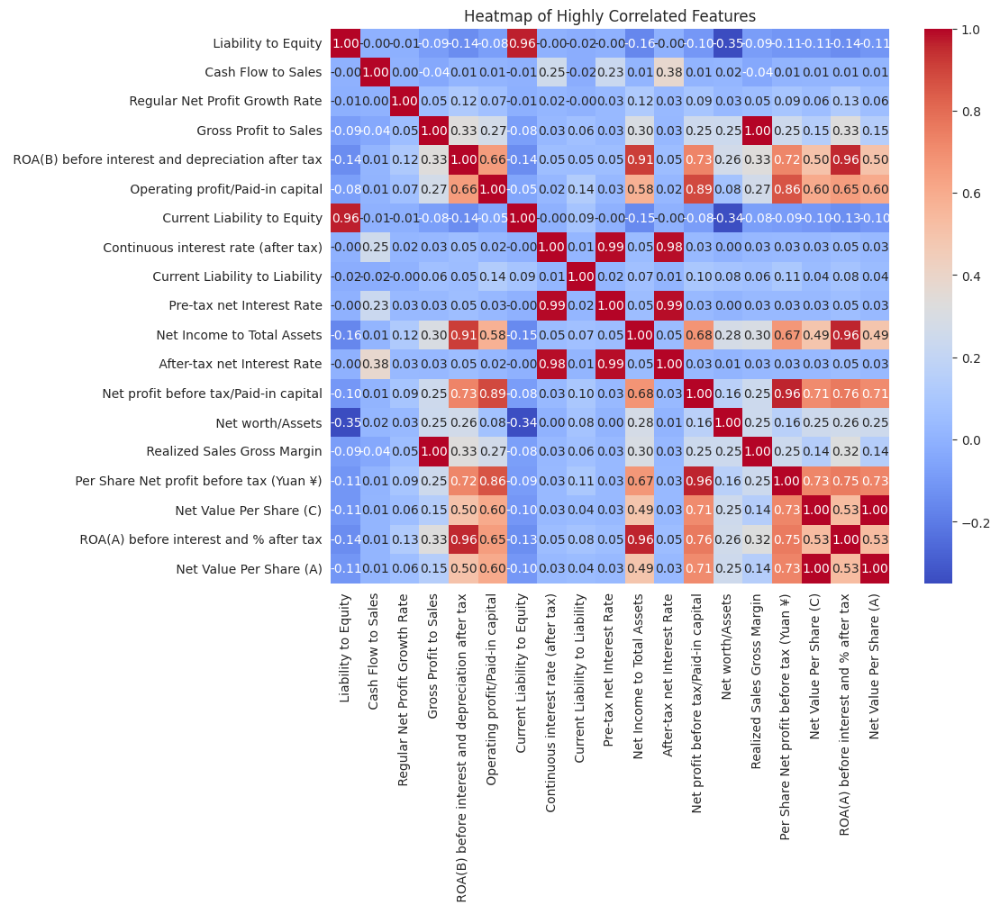

In [15]:
# 1. Calculate the feature-feature correlation matrix
corr_matrix = df.drop('Bankrupt?', axis=1).corr().abs()

# 2. Create a mask to select only the upper triangle (to avoid duplicate and self-correlations)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 3. Find pairs with correlation > 0.9 (Multicollinearity Threshold)
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

print(f"Number of features with high multicollinearity (>0.9): {len(to_drop)}")
print("Highly correlated features to consider dropping:", to_drop)

# Visualize only the highly correlated features if the list is manageable
# If len(to_drop) is small (e.g., < 20), you can plot a subset heatmap
if len(to_drop) < 20:
    subset_features = list(set(to_drop + [col for col in upper.columns if any(upper[col] > 0.9)]))
    plt.figure(figsize=(10, 8))
    sns.heatmap(df[subset_features].corr(), annot=True, fmt='.2f', cmap='coolwarm')
    plt.title('Heatmap of Highly Correlated Features')
    plt.show()

## **II. PCA and Model Training**

**1. Checking Class Imbalance**

In [13]:
# Check class balance
print(df['Bankrupt?'].value_counts())
print("\nClass distribution (%):")
print(df['Bankrupt?'].value_counts(normalize=True) * 100)

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

Class distribution (%):
Bankrupt?
0    96.77372
1     3.22628
Name: proportion, dtype: float64


> Since the class distribution is shows a severe imbalance between the two classes. only about 3% of companies went bankrupt.
> This imbalance can bias the Decision Tree toward always predicting **“Not Bankrupt”** (the majority class), giving a *high accuracy* but *poor recall* for bankrupt companies. (critical cases)

#### **2. Importing Libraries**

In [18]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split # Added import
import numpy as np
import matplotlib.pyplot as plt

#### **3. Prepare Data**

In [16]:
print("Step 1: Preparing data...")
X = df.drop(columns=['Bankrupt?'])
y = df['Bankrupt?']

print(f"Original dataset shape: {X.shape}")
print(f"Number of features: {X.shape[1]}")

Step 1: Preparing data...
Original dataset shape: (6819, 95)
Number of features: 95


#### **4. Split the Dataset**

In [19]:
print("Step 2: Splitting data into train and test sets...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Training set size: {X_train.shape[0]} samples")
print(f"Test set size: {X_test.shape[0]} samples")
print(f"Class distribution in training set:\n{y_train.value_counts()}")

Step 2: Splitting data into train and test sets...
Training set size: 5455 samples
Test set size: 1364 samples
Class distribution in training set:
Bankrupt?
0    5279
1     176
Name: count, dtype: int64


#### **5. Adding PCA**

In [20]:
print("Step 3: Performing exploratory PCA analysis...")

# Fit scaler and PCA on training data to determine optimal components
scaler_explore = StandardScaler()
X_train_scaled = scaler_explore.fit_transform(X_train)

pca_explore = PCA()
pca_explore.fit(X_train_scaled)

# Calculate cumulative variance
cumulative_variance = np.cumsum(pca_explore.explained_variance_ratio_)

# Find number of components for 95% variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1

print(f"Number of components for 95% variance: {n_components_95}")
print(f"Number of components for 90% variance: {np.argmax(cumulative_variance >= 0.90) + 1}")
print(f"Number of components for 99% variance: {np.argmax(cumulative_variance >= 0.99) + 1}")

Step 3: Performing exploratory PCA analysis...
Number of components for 95% variance: 50
Number of components for 90% variance: 42
Number of components for 99% variance: 62


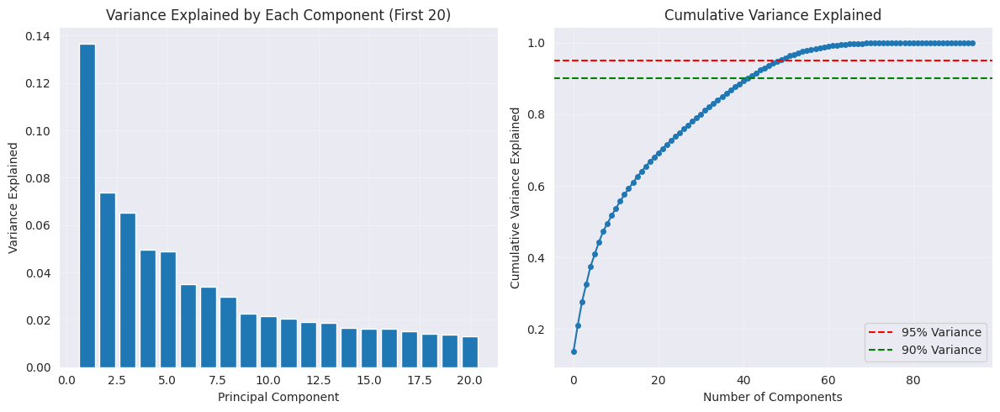

In [21]:
#Visualizing the variance
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.bar(range(1, min(21, len(pca_explore.explained_variance_ratio_) + 1)),
        pca_explore.explained_variance_ratio_[:20])
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by Each Component (First 20)')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(cumulative_variance, marker='o', markersize=4)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance')
plt.axhline(y=0.90, color='g', linestyle='--', label='90% Variance')
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

#### **6. Defining the Pipeline**

In [22]:
print("Step 4: Building pipeline with StandardScaler → PCA → SMOTE → DecisionTree...")

pipeline_steps = [
    ('scaler', StandardScaler()),  # Step 1: Standardize features (required for PCA)
    ('pca', PCA(n_components=0.95)),  # Step 2: Reduce dimensions (retain 95% variance)
    ('smote', SMOTE(random_state=42)),  # Step 3: Handle class imbalance
    ('decision_tree', DecisionTreeClassifier(random_state=42, class_weight='balanced'))  # Step 4: Classifier
]

model_pipeline = Pipeline(steps=pipeline_steps)

print("\nPipeline structure:")
for i, (name, step) in enumerate(pipeline_steps, 1):
    print(f"  {i}. {name}: {type(step).__name__}")

Step 4: Building pipeline with StandardScaler → PCA → SMOTE → DecisionTree...

Pipeline structure:
  1. scaler: StandardScaler
  2. pca: PCA
  3. smote: SMOTE
  4. decision_tree: DecisionTreeClassifier


#### **7. Train the Pipeline**

In [23]:
print("Step 5: Training the pipeline...")
model_pipeline.fit(X_train, y_train)

Step 5: Training the pipeline...


Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.95)),
                ('smote', SMOTE(random_state=42)),
                ('decision_tree',
                 DecisionTreeClassifier(class_weight='balanced',
                                        random_state=42))])

#### **8. Number of Components Used**

In [24]:
n_components_used = model_pipeline.named_steps['pca'].n_components_
print(f"\n✓ Model trained successfully!")
print(f"  - Original features: {X.shape[1]}")
print(f"  - PCA components used: {n_components_used}")
print(f"  - Dimensionality reduction: {X.shape[1] - n_components_used} features removed")
print(f"  - Variance retained: {sum(model_pipeline.named_steps['pca'].explained_variance_ratio_):.2%}")


✓ Model trained successfully!
  - Original features: 95
  - PCA components used: 50
  - Dimensionality reduction: 45 features removed
  - Variance retained: 95.31%


#### **9. Make Prediction**

In [25]:
print("Step 6: Making predictions on test set...")
y_pred = model_pipeline.predict(X_test)

Step 6: Making predictions on test set...


#### **10. Evaluating the Model**


Step 7: Evaluating model performance...


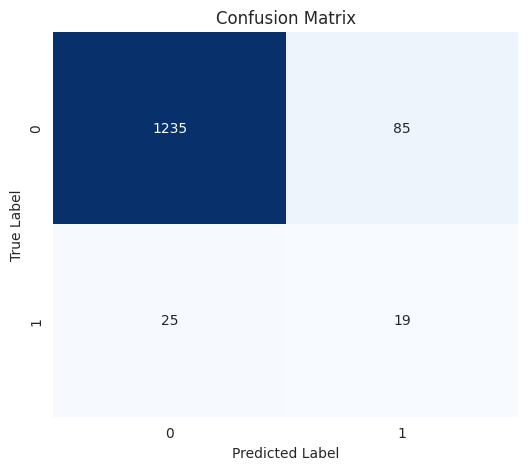


True Negatives (TN): 1235
False Positives (FP): 85
False Negatives (FN): 25
True Positives (TP): 19

CLASSIFICATION REPORT
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      1320
           1       0.18      0.43      0.26        44

    accuracy                           0.92      1364
   macro avg       0.58      0.68      0.61      1364
weighted avg       0.95      0.92      0.93      1364



In [27]:
print("\nStep 7: Evaluating model performance...")

# --- 1. Compute Confusion Matrix ---
cm = confusion_matrix(y_test, y_pred)

# --- 2. Display Confusion Matrix as Seaborn Heatmap ---
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# --- 3. Print TN, FP, FN, TP ---
print(f"\nTrue Negatives (TN): {cm[0,0]}")
print(f"False Positives (FP): {cm[0,1]}")
print(f"False Negatives (FN): {cm[1,0]}")
print(f"True Positives (TP): {cm[1,1]}")

# --- 4. Classification Report ---
print("\n" + "="*50)
print("CLASSIFICATION REPORT")
print("="*50)
print(classification_report(y_test, y_pred))


#### **10.b ROC and AUC**


ROC AUC Score: 0.6837


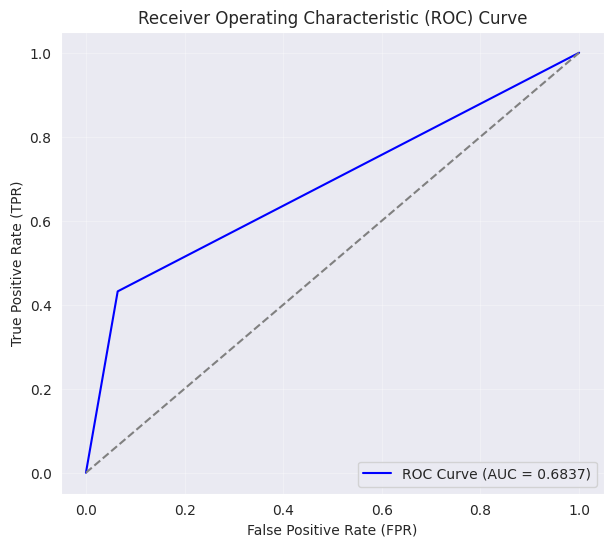

In [28]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# --- 1. Predict probabilities for the positive class ---
# For ROC and AUC, we need the probability estimates of class 1
y_pred_proba = model_pipeline.predict_proba(X_test)[:, 1]

# --- 2. Compute ROC curve ---
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# --- 3. Compute AUC score ---
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f"\nROC AUC Score: {auc_score:.4f}")

# --- 4. Plot ROC curve ---
plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc_score:.4f})')
plt.plot([0,1], [0,1], color='gray', linestyle='--')  # Diagonal line
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

## **III. Hyperparameter Tuning**

> There are multiple Hyper-parameters which can be used to fine tune a Decision Tree

1. *MAX_DEPTH* = Maximum depth of the tree → prevents overfitting
2. *MIN_SAMPLE_SPLIT* = Minimum samples needed to split a node → controls tree growth
3. *MIN_SAMPLE_LEAF* = Minimum samples at a leaf node → prevents very small leaves
4. *MAX_FEATURES* = Number of features considered at each split → reduces variance
5. *CRITERION* = 'gini' or 'entropy' → splitting measure
6. *CLASS_WEIGHT* = 'balanced' → automatically handle imbalance

In [34]:
print("\n\n" + "="*70)
print("HYPERPARAMETER TUNING WITH GRID SEARCH")
print("="*70)

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
import warnings
warnings.filterwarnings('ignore')



HYPERPARAMETER TUNING WITH GRID SEARCH


#### **1. Defining Hyperparameter Tuning Grid**

In [35]:
print("Step 1: Defining hyperparameter search space...")

param_grid = {
    # PCA parameters
    'pca__n_components': [0.90, 0.95, 0.99, 10, 15, 20],

    # SMOTE parameters
    'smote__k_neighbors': [3, 5, 7],
    'smote__sampling_strategy': ['auto', 0.5, 0.75],

    # Decision Tree parameters
    'decision_tree__criterion': ['gini', 'entropy'],
    'decision_tree__max_depth': [5, 10, 15, 20, None],
    'decision_tree__min_samples_split': [2, 5, 10, 20],
    'decision_tree__min_samples_leaf': [1, 2, 4, 8],
    'decision_tree__max_features': ['sqrt', 'log2', None],
}

print("\nHyperparameters to tune:")
for param, values in param_grid.items():
    print(f"  • {param}: {values}")

total_combinations = np.prod([len(v) for v in param_grid.values()])
print(f"\nTotal combinations to evaluate: {total_combinations:,}")


Step 1: Defining hyperparameter search space...

Hyperparameters to tune:
  • pca__n_components: [0.9, 0.95, 0.99, 10, 15, 20]
  • smote__k_neighbors: [3, 5, 7]
  • smote__sampling_strategy: ['auto', 0.5, 0.75]
  • decision_tree__criterion: ['gini', 'entropy']
  • decision_tree__max_depth: [5, 10, 15, 20, None]
  • decision_tree__min_samples_split: [2, 5, 10, 20]
  • decision_tree__min_samples_leaf: [1, 2, 4, 8]
  • decision_tree__max_features: ['sqrt', 'log2', None]

Total combinations to evaluate: 25,920


#### **2. Performing Randomized Search**

In [38]:
print("\nStep 2: Performing Randomized Search with Cross-Validation...")
print("⏳ This will evaluate 50 random combinations (much faster than Grid Search)...\n")

randomized_search = RandomizedSearchCV(
    estimator=model_pipeline,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    cv=3,  # 3-fold cross-validation (reduced from 5 for speed)
    scoring='f1',  # Optimize for F1-score (good for imbalanced data)
    n_jobs=-1,  # Use all CPU cores
    verbose=2,
    random_state=42,
    return_train_score=True
)

print(f"Total combinations to evaluate: 50 (randomly sampled)")
print(f"Total fits: {50 * 3} (50 combinations × 3 folds)")

# Fit randomized search
randomized_search.fit(X_train, y_train)

print("\n✓ Randomized Search completed!")


Step 2: Performing Randomized Search with Cross-Validation...
⏳ This will evaluate 50 random combinations (much faster than Grid Search)...

Total combinations to evaluate: 50 (randomly sampled)
Total fits: 150 (50 combinations × 3 folds)
Fitting 3 folds for each of 50 candidates, totalling 150 fits

✓ Randomized Search completed!


#### **3. Displaying Best Hyper-Parameters**

In [40]:
print("\n" + "="*70)
print("BEST HYPERPARAMETERS FOUND")
print("="*70)

print("\nBest parameters:")
for param, value in randomized_search.best_params_.items():
    print(f"  • {param}: {value}")

print(f"\nBest cross-validation F1-score: {randomized_search.best_score_:.4f}")


BEST HYPERPARAMETERS FOUND

Best parameters:
  • smote__sampling_strategy: auto
  • smote__k_neighbors: 3
  • pca__n_components: 0.99
  • decision_tree__min_samples_split: 5
  • decision_tree__min_samples_leaf: 2
  • decision_tree__max_features: None
  • decision_tree__max_depth: 10
  • decision_tree__criterion: entropy

Best cross-validation F1-score: 0.2781


#### **4. Evaluating Tuned Model**

In [41]:
print("\n" + "="*70)
print("TUNED MODEL PERFORMANCE")
print("="*70)

# Get best model
best_model = randomized_search.best_estimator_

# Predictions with tuned model
y_pred_tuned = best_model.predict(X_test)

# Confusion Matrix
print("\n--- Confusion Matrix (Tuned Model) ---")
cm_tuned = confusion_matrix(y_test, y_pred_tuned)
print(cm_tuned)
print(f"\nTrue Negatives (TN): {cm_tuned[0,0]}")
print(f"False Positives (FP): {cm_tuned[0,1]}")
print(f"False Negatives (FN): {cm_tuned[1,0]}")
print(f"True Positives (TP): {cm_tuned[1,1]}")

# Classification Report
print("\n--- Classification Report (Tuned Model) ---")
print(classification_report(y_test, y_pred_tuned))


TUNED MODEL PERFORMANCE

--- Confusion Matrix (Tuned Model) ---
[[1230   90]
 [  21   23]]

True Negatives (TN): 1230
False Positives (FP): 90
False Negatives (FN): 21
True Positives (TP): 23

--- Classification Report (Tuned Model) ---
              precision    recall  f1-score   support

           0       0.98      0.93      0.96      1320
           1       0.20      0.52      0.29        44

    accuracy                           0.92      1364
   macro avg       0.59      0.73      0.62      1364
weighted avg       0.96      0.92      0.94      1364



#### **5. Comparing Before and After Tuning**

In [42]:
print("\n" + "="*70)
print("PERFORMANCE COMPARISON: BEFORE vs AFTER TUNING")
print("="*70)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics for both models
metrics_before = {
    'Accuracy': accuracy_score(y_test, y_pred),
    'Precision': precision_score(y_test, y_pred),
    'Recall': recall_score(y_test, y_pred),
    'F1-Score': f1_score(y_test, y_pred)
}

metrics_after = {
    'Accuracy': accuracy_score(y_test, y_pred_tuned),
    'Precision': precision_score(y_test, y_pred_tuned),
    'Recall': recall_score(y_test, y_pred_tuned),
    'F1-Score': f1_score(y_test, y_pred_tuned)
}

comparison_df = pd.DataFrame({
    'Before Tuning': metrics_before,
    'After Tuning': metrics_after,
    'Improvement': {k: metrics_after[k] - metrics_before[k] for k in metrics_before}
})

print("\n", comparison_df)


PERFORMANCE COMPARISON: BEFORE vs AFTER TUNING

            Before Tuning  After Tuning  Improvement
Accuracy        0.919355      0.918622    -0.000733
Precision       0.182692      0.203540     0.020848
Recall          0.431818      0.522727     0.090909
F1-Score        0.256757      0.292994     0.036237


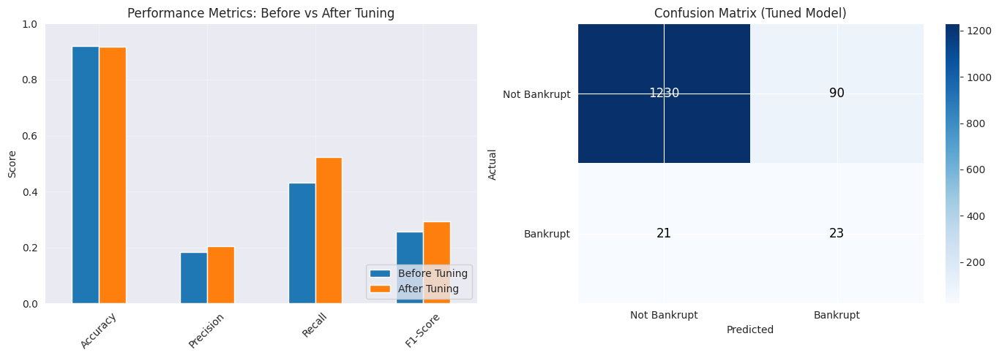

In [51]:
# --- Visualize comparison ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- Plot 1: Metrics comparison ---
comparison_df[['Before Tuning', 'After Tuning']].plot(kind='bar', ax=axes[0], rot=45)
axes[0].set_title('Performance Metrics: Before vs After Tuning')
axes[0].set_ylabel('Score')
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0, 1])

# --- Plot 2: Confusion Matrix with values ---
im = axes[1].imshow(cm_tuned, cmap='Blues', aspect='auto')
axes[1].set_title('Confusion Matrix (Tuned Model)')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')
axes[1].set_xticks([0, 1])
axes[1].set_yticks([0, 1])
axes[1].set_xticklabels(['Not Bankrupt', 'Bankrupt'])
axes[1].set_yticklabels(['Not Bankrupt', 'Bankrupt'])

# Annotate the counts inside the cells
thresh = cm_tuned.max() / 2.0
for i in range(cm_tuned.shape[0]):
    for j in range(cm_tuned.shape[1]):
        count = cm_tuned[i, j]

        # Set text color: 'white' for dark cells, 'black' for light cells
        text_color = "white" if count > thresh else "black"

        axes[1].text(j, i, str(count),
                     ha='center', va='center',
                     color=text_color,          # Use the determined color
                     fontsize=12
                     )

# Optional: Add a colorbar
fig.colorbar(im, ax=axes[1])

plt.tight_layout()
plt.show()

#### **6. Analyzing the Result of Randomized Search**

In [53]:
# --- Top 10 Parameter Combinations ---
print("\n" + "="*70)
print("TOP 10 PARAMETER COMBINATIONS")
print("="*70)

results_df = pd.DataFrame(randomized_search.cv_results_)
top_10 = results_df.nsmallest(10, 'rank_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]

print("\n", top_10.to_string(index=False))

print("\n" + "="*70)
print("HYPERPARAMETER TUNING COMPLETE!")
print("="*70)


TOP 10 PARAMETER COMBINATIONS

                                                                                                                                                                                                                                                                              params  mean_test_score  std_test_score  rank_test_score
  {'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 0.99, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': None, 'decision_tree__max_depth': 10, 'decision_tree__criterion': 'entropy'}         0.278068        0.010922                1
    {'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 5, 'pca__n_components': 10, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 4, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'entropy'}         0.274678        0.009516       

In [54]:
from IPython.display import display, HTML

# --- Convert RandomizedSearchCV results to DataFrame ---
results_df = pd.DataFrame(randomized_search.cv_results_)

# --- Select top 10 parameter combinations ---
top_10 = results_df.nsmallest(10, 'rank_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]

# --- Display as a table in the notebook ---
display(HTML(top_10.to_html(index=False)))

# Optional: add styling
styled_table = top_10.style.background_gradient(cmap='viridis') \
                              .set_caption("Top 10 Hyperparameter Combinations") \
                              .format({'mean_test_score': "{:.4f}", 'std_test_score': "{:.4f}"})
display(styled_table)


params,mean_test_score,std_test_score,rank_test_score
"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 0.99, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': None, 'decision_tree__max_depth': 10, 'decision_tree__criterion': 'entropy'}",0.278068,0.010922,1
"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 5, 'pca__n_components': 10, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 4, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'entropy'}",0.274678,0.009516,2
"{'smote__sampling_strategy': 0.5, 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 2, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': 'sqrt', 'decision_tree__max_depth': None, 'decision_tree__criterion': 'gini'}",0.274174,0.023374,3
"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 3, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'entropy'}",0.272613,0.038542,4
"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 5, 'pca__n_components': 10, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 8, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': None, 'decision_tree__criterion': 'gini'}",0.270165,0.033124,5
"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 15, 'decision_tree__min_samples_split': 20, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'gini'}",0.269388,0.047609,6
"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'gini'}",0.267591,0.005190,7
"{'smote__sampling_strategy': 0.5, 'smote__k_neighbors': 7, 'pca__n_components': 20, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': None, 'decision_tree__max_depth': 10, 'decision_tree__criterion': 'gini'}",0.267247,0.012962,8
"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 8, 'decision_tree__max_features': 'sqrt', 'decision_tree__max_depth': 15, 'decision_tree__criterion': 'entropy'}",0.264337,0.011084,9
"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 0.95, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 4, 'decision_tree__max_features': None, 'decision_tree__max_depth': None, 'decision_tree__criterion': 'entropy'}",0.262295,0.050453,10


,params,mean_test_score,std_test_score,rank_test_score
23,"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 0.99, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': None, 'decision_tree__max_depth': 10, 'decision_tree__criterion': 'entropy'}",0.2781,0.0109,1
7,"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 5, 'pca__n_components': 10, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 4, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'entropy'}",0.2747,0.0095,2
48,"{'smote__sampling_strategy': 0.5, 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 2, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': 'sqrt', 'decision_tree__max_depth': None, 'decision_tree__criterion': 'gini'}",0.2742,0.0234,3
11,"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 3, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 2, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'entropy'}",0.2726,0.0385,4
5,"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 5, 'pca__n_components': 10, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 8, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': None, 'decision_tree__criterion': 'gini'}",0.2702,0.0331,5
45,"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 15, 'decision_tree__min_samples_split': 20, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'gini'}",0.2694,0.0476,6
49,"{'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': 'log2', 'decision_tree__max_depth': 20, 'decision_tree__criterion': 'gini'}",0.2676,0.0052,7
10,"{'smote__sampling_strategy': 0.5, 'smote__k_neighbors': 7, 'pca__n_components': 20, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 1, 'decision_tree__max_features': None, 'decision_tree__max_depth': 10, 'decision_tree__criterion': 'gini'}",0.2672,0.0130,8
29,"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 7, 'pca__n_components': 15, 'decision_tree__min_samples_split': 10, 'decision_tree__min_samples_leaf': 8, 'decision_tree__max_features': 'sqrt', 'decision_tree__max_depth': 15, 'decision_tree__criterion': 'entropy'}",0.2643,0.0111,9
33,"{'smote__sampling_strategy': 'auto', 'smote__k_neighbors': 3, 'pca__n_components': 0.95, 'decision_tree__min_samples_split': 5, 'decision_tree__min_samples_leaf': 4, 'decision_tree__max_features': None, 'decision_tree__max_depth': None, 'decision_tree__criterion': 'entropy'}",0.2623,0.0505,10
